# Homework 2
## DS 3000: Foundation of Data Science
Name: Vivian Shu Yi Li <br>
NUID: 001506227 <br>
Date: May 31, 2023 <br>

## Upload libraries and filter dataset

In [1]:
# import libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from datetime import datetime
import plotly.express as px
import folium
from folium.plugins import HeatMap
from branca.colormap import LinearColormap

In [2]:
def read_file(filename):
    """ reading csv file
    Args:
        filename (str): csv file
    
    Return:
        dataframe of the filtered csv file
    """
    # read the csv file
    crime = pd.read_csv(filename)
    
    # delete unnecessary cols
    del_col = ['OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING', 
               'UCR_PART', 'Location']
    crime = crime.drop(columns=del_col)
    
    # assuming each incident_number is assigned to individual offense
    # drop all the duplicates
    crime = crime.drop_duplicates(subset='INCIDENT_NUMBER')
    
    # sort df based on lat, then long, then street name
    crime = crime.sort_values(by='Lat').sort_values(by='Long').sort_values(by='STREET')
    
    # drop col without a lat, long, and location
    crime = crime.dropna(how='all', subset=['Lat', 'Long', 'STREET'])
    crime = crime.dropna(how='any', subset=['Lat', 'Long'])

    # fill the missing values (lat & long) in csv df w/ average of neighboring points 
    # using interpolation
    crime['Lat'] = crime['Lat'].interpolate()
    crime['Long'] = crime['Long'].interpolate()
    
    # change date-time col to just date
    date_series = pd.Series(crime["OCCURRED_ON_DATE"])
    
    # Convert the Series to pandas datetime type
    date_series = pd.to_datetime(date_series, format="%Y-%m-%d %H:%M:%S")

    # Extract only the date component
    crime["OCCURRED_ON_DATE"] = date_series.dt.date
    
    return crime

In [3]:
def df_merged(df1, df2, df3):
    """merges three dataframe using full merge
    
    Args:
        df1, df2, df3 (dataframe): input dataframe
    
    Returns:
        DataFrame: a merged dataframe
    """
    combined_df = pd.concat([df1, df2, df3], axis=0, ignore_index=True)

    return combined_df

In [4]:
# read the csv file
crime_2018 = read_file('boston_crime_2018.csv')
crime_2020 = read_file('boston_crime_2020.csv')
crime_2022 = read_file('boston_crime_2022.csv')

# merge all to form one df
merged_df = df_merged(crime_2018, crime_2020, crime_2022)

/var/folders/9m/1hg1hctj5s94qtlnx8n6561h0000gn/T/ipykernel_15246/2804055041.py:10: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  crime = pd.read_csv(filename)
/var/folders/9m/1hg1hctj5s94qtlnx8n6561h0000gn/T/ipykernel_15246/2804055041.py:10: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  crime = pd.read_csv(filename)


In [5]:
# show crime 2018 dataframe
crime_2018

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,STREET,Lat,Long
7362,I182007938,724,Auto Theft,2018-01-29,2018,1,Monday,22,BLUE HILL AVE,42.317304,-71.077996
3084,I192024845,1201,Embezzlement,2018-01-13,2018,1,Saturday,0,A ST,42.250558,-71.125121
41019,I182043370,3006,Medical Assistance,2018-06-05,2018,6,Tuesday,11,A ST,42.350361,-71.048465
1906,I182002018,3830,Motor Vehicle Accident Response,2018-01-09,2018,1,Tuesday,6,A ST,42.340579,-71.057045
64638,I182068210,3802,Motor Vehicle Accident Response,2018-08-25,2018,8,Saturday,14,A ST,42.350361,-71.048465
...,...,...,...,...,...,...,...,...,...,...,...
96847,I182103023,3803,Motor Vehicle Accident Response,2018-12-22,2018,12,Saturday,8,NaN,42.301771,-71.051049
48722,I182051405,2905,Violations,2018-06-30,2018,6,Saturday,17,NaN,42.301771,-71.051049
84836,I182089577,3807,Motor Vehicle Accident Response,2018-11-05,2018,11,Monday,16,NaN,42.283989,-71.046729
98810,I192006194,3802,Motor Vehicle Accident Response,2018-12-31,2018,12,Monday,18,NaN,42.351020,-71.046080


In [6]:
# show crime 2020 dataframe
crime_2020

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,STREET,Lat,Long
20677,202028338,3126,NaN,2020-04-21,2020,4,Tuesday,0,//,42.337557,-71.078360
21069,202028919,3831,NaN,2020-04-23,2020,4,Thursday,19,1 BENTHAM RD\nDORCHESTER MA 02122\nUNITED STATES,42.303287,-71.063634
64072,202086590,301,NaN,2020-11-23,2020,11,Monday,20,1 COURTHOUSE WAY\nSOUTH BOSTON MA 02210\nUNIT...,42.354048,-71.046390
66256,202089442,301,NaN,2020-12-05,2020,12,Saturday,14,1 ERIE ST\nDORCHESTER MA 02121\nUNITED STATES,42.303157,-71.078748
9220,202012516,3831,NaN,2020-02-14,2020,2,Friday,23,1 HASTINGS ST\nWEST ROXBURY MA 02132\nUNITED ...,42.285258,-71.155266
...,...,...,...,...,...,...,...,...,...,...,...
63170,202085372,520,NaN,2020-11-19,2020,11,Thursday,9,ZELLER ST,42.291866,-71.136355
9795,202013278,3119,NaN,2020-02-18,2020,2,Tuesday,8,ZIEGLER ST,42.328947,-71.085056
68871,202092962,3803,NaN,2020-12-20,2020,12,Sunday,9,ZIEGLER ST & WARREN ST\nBOSTON MA 02119\nUNIT...,42.329496,-71.083340
37163,202050978,3830,NaN,2020-07-19,2020,7,Sunday,10,ZIEGLER ST & WARREN ST\nBOSTON MA 02119\nUNIT...,42.329496,-71.083340


In [7]:
# show crime 2022b dataframe
crime_2022

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,STREET,Lat,Long
28634,222038231,3114,NaN,2022-05-27,2022,5,Friday,9,50,42.351435,-71.069693
70386,222095998,3831,NaN,2022-12-12,2022,12,Monday,16,A ST,42.346711,-71.051311
50234,222067896,3410,NaN,2022-09-04,2022,9,Sunday,9,A ST,42.250558,-71.125121
55321,222074940,3831,NaN,2022-09-28,2022,9,Wednesday,18,A ST,42.347248,-71.050894
40039,222053953,614,NaN,2022-07-19,2022,7,Tuesday,8,A ST,42.347248,-71.050894
...,...,...,...,...,...,...,...,...,...,...,...
47836,222064646,1831,NaN,2022-08-24,2022,8,Wednesday,0,ZEIGLER ST & DEARBORN ST\nBOSTON MA 02119\nUN...,42.328960,-71.079130
4709,222006230,3821,NaN,2022-01-27,2022,1,Thursday,17,ZEIGLER ST & HARRISON AVE\nROXBURY MA 02119\n...,42.329298,-71.082484
33090,222044336,1810,NaN,2022-06-16,2022,6,Thursday,13,ZEIGLER ST & HARRISON AVE\nROXBURY MA 02119\n...,42.329298,-71.082484
63004,222085679,301,NaN,2022-11-05,2022,11,Saturday,10,ZEIGLER ST & WARREN ST\nROXBURY MA 02119\nUNI...,42.329391,-71.083340


### Creating new dataframe

In [8]:
# create list of years
year = [2018, 2020, 2022]

# create dic to store all crime counts
m_counts = {}
d_counts = {}

# interate thru each year
for y in year:
    # filter years:
    specific_y = merged_df[merged_df['YEAR']==y] 
    
    # count crime in each month
    counts = specific_y['MONTH'].value_counts()
    counts = counts.sort_index()
    # add to dict
    m_counts[y] = counts
    
    # count crime in each day
    num = specific_y['DAY_OF_WEEK'].value_counts()
    num = num.sort_index()
    # add to dict
    d_counts[y] = num
    
    
# create dataframe for crime count per month
m_crime = pd.DataFrame(m_counts)
m_crime = m_crime.rename_axis('month')

# create dataframe for crime count per day of week
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday",
            "Saturday", "Sunday"]
d_crime = pd.DataFrame(d_counts)
d_crime = d_crime.reindex(index=day_order)
d_crime = d_crime.rename_axis('day of week')

In [9]:
# new dataframe for monthly crimes
m_crime

,2018,2020,2022
month,,,
1,6479,6253,5306
2,5688,5793,5188
3,6436,5426,5833
4,6602,4288,5792
5,7390,5308,6138
6,7357,5807,6191
7,7125,5996,6379
8,7308,6391,6274
9,6943,6325,5938


In [10]:
# new dataframe for weekly count crimes
d_crime

,2018,2020,2022
day of week,,,
Monday,11795,10033,10140
Tuesday,11669,9925,9927
Wednesday,11836,10264,10272
Thursday,11771,10170,10263
Friday,12228,10476,10695
Saturday,11428,9571,10078
Sunday,10240,8708,8669


In [11]:
# create new col = total case
d_crime['total'] = d_crime.sum(axis=1)
d_crime['total'] = d_crime['total'].round(0).astype(int)
d_crime

,2018,2020,2022,total
day of week,,,,
Monday,11795,10033,10140,31968
Tuesday,11669,9925,9927,31521
Wednesday,11836,10264,10272,32372
Thursday,11771,10170,10263,32204
Friday,12228,10476,10695,33399
Saturday,11428,9571,10078,31077
Sunday,10240,8708,8669,27617


## Graphs

### Bar Graphs

In [12]:
def bar(df):
    """ create bar graph of num of crime per month
    
    Args:
        df: cvs file 
        
    Return:
        bar plot
    
    """
    # create empty dic to store crime counts   
    count = {}
    
    # loop over each month 
    for i in range(1,13):
        # initiate the dic key & values
        count[i] = 0
        for months in df.MONTH:
            # add up the # of reported crime per month
            if months == i:
                count[i] += 1

    # set up color palette
    sns.set_palette('Set2')
    
    # plot the bar chart
    for key, value in count.items():
        plt.bar(key, value)

    # Set the x-axis label, y-axis label, xticks
    plt.xlabel('Month')
    plt.ylabel('Crime Rate')
    plt.xticks(range(1,13))
    plt.grid(alpha=0.3)

    # Show the plot
    plt.show()


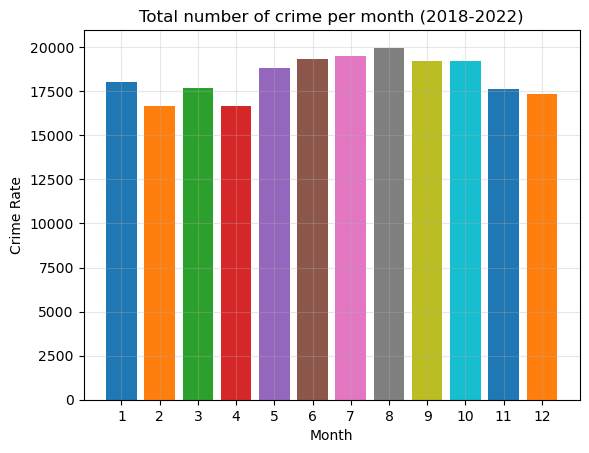

In [13]:
# plot merged df
plt.title('Total number of crime per month (2018-2022)')
bar(merged_df)

### Interactive bar graphs

In [14]:
# month/year
# make a list of years we want to plot
yr = [2018, 2020, 2022]

# iterate thru yr and plot using the m_crime df
for i in yr:
    fig = px.bar(data_frame=m_crime, x=m_crime.index, y=i, color=m_crime.index)
    
    # edit the hover_data
    fig.update_traces(hovertemplate='Month: %{x}<br>Count: %{y}')
    
    # add title
    fig.update_layout(title = (f'Crime Count per Month in {i}'), 
                      xaxis_title='Months', yaxis_title='Crime Count')

    fig.show()

In [15]:
# day of week
# make a list of years we want to plot
yr = [2018, 2020, 2022]

# iterate thru yr and plot using the m_crime df
for i in yr:
    fig = px.bar(data_frame=d_crime, x=d_crime.index, y=i, color=d_crime.index)
    
    # edit the hover_data
    fig.update_traces(hovertemplate='Day: %{x}<br>Count: %{y}')
    
    # add title
    fig.update_layout(title = (f'Crime Count For Each Day of Week in {i}'), 
                      xaxis_title='Day of Week', yaxis_title='Crime Count')

    fig.show()

## Line graph to compare years & months

In [16]:
def line(df1, df2, df3):
    """
    Graph a line plot showing the crime rate per month for multiple dataframes
    
    Args:
        df1, df2, df3: Dataframes representing different datasets
    
    Returns:
        line plot
    """
    # create list of df
    year_df = [df1, df2, df3]
    
    # create list of corresponding years to df
    years = [2018, 2020, 2022]

    # iterate thru years & df
    for i in range(len(year_df)):
        df = year_df[i]
        year = years[i]

        # create empty dictionary to store crime counts
        count = {}

        # loop over each month
        for i in range(1, 13):
            # Initialize the dictionary key-value 
            count[i] = 0

        # count the number of reported crimes per month
        for month in df['MONTH']:
            count[month] += 1

        # extract the month and count data
        x = list(count.keys())
        y = list(count.values())

        # plot the line chart
        plt.plot(x, y, label=str(year))

    # set the x-axis label, y-axis label, and x-ticks
    plt.legend()
    plt.xlabel('Month')
    plt.ylabel('Crime Count')
    plt.xticks(range(1, 13))
    plt.title('Crime Counts Comparison (2018-2022)')
    plt.grid()

    # Show the plot
    plt.show()



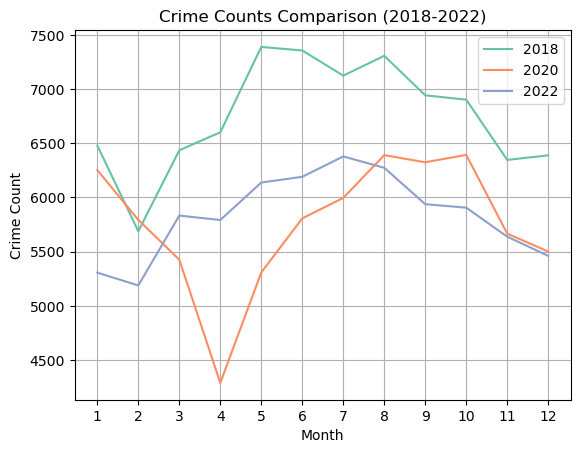

In [17]:
# plot line graph
line(crime_2018, crime_2020, crime_2022)

### Heatmap - show density

In [18]:
def heatmap(df, y):
    """ heatmap of the crime locations
    
    Args: 
        df: dataframe of chosen csv
        y (int): year
        
    Return:
        heatmap
    """
    
    # initalize array
    crime_map = np.zeros((1000, 1000), dtype=int)

    # Define the bounds of the map (given from hw 1 about boston)
    max_lat = 42.4
    min_lat = 42.2
    
    max_lon = -71.2
    min_lon = -70.9

    # Iterate over the rows 
    for index, row in df.iterrows():
        # Get the latitude and longitude from the dataset
        lat = row['Lat']
        lon = row['Long']

        # the coordinates are within the defined bounds
        i = 1000 - int((lat - min_lat) / (max_lat - min_lat) * 1000)
        j = int((lon - min_lon) / (max_lon - min_lon)*1000)
        if i < 1000 and j < 1000:
        
            # increment count
            crime_map[i, j] += 1

    
    # Plot the heatmap
    plt.figure(dpi=600)
    plt.imshow(crime_map, cmap='plasma', vmax=1, alpha=1, origin='lower')
    plt.title(f'Crime Map {y}')
    plt.colorbar(label=f'crime percentage', cmap='plasma')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.xlim(200,1000)
    plt.ylim(0, 900)
    plt.grid(alpha=0.2)
    plt.show()
    

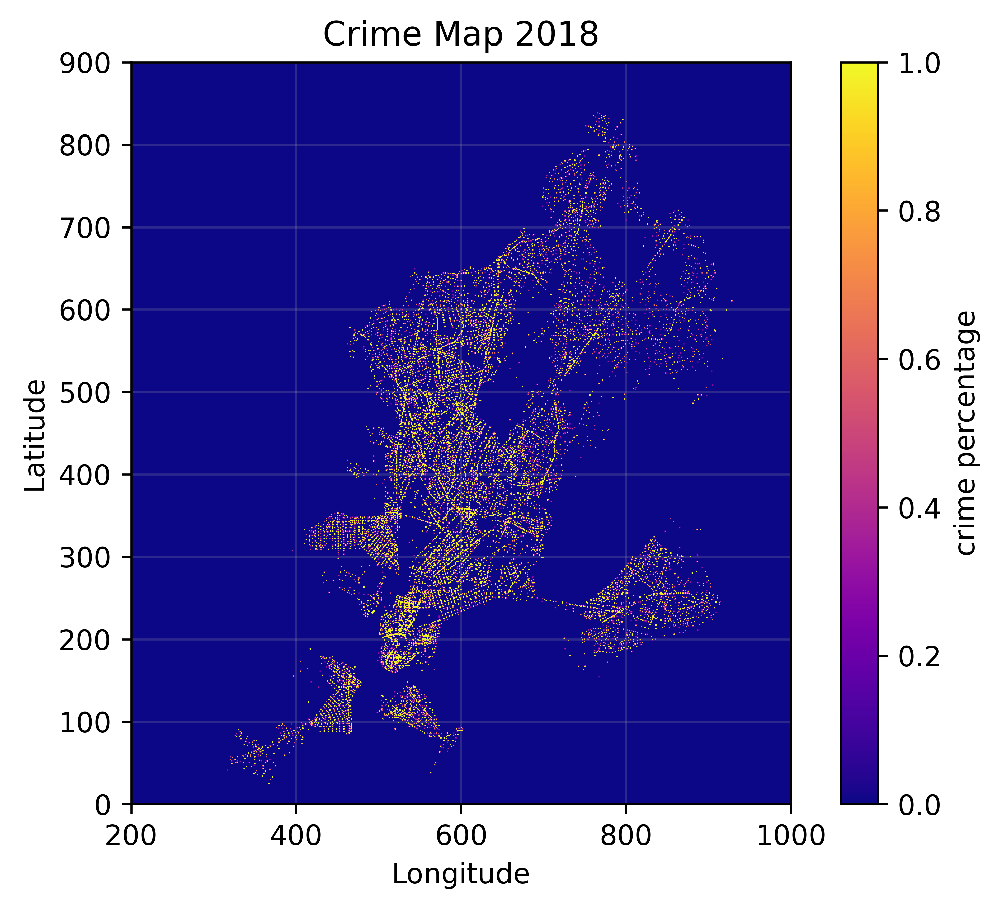

In [19]:
heatmap(crime_2018, 2018)

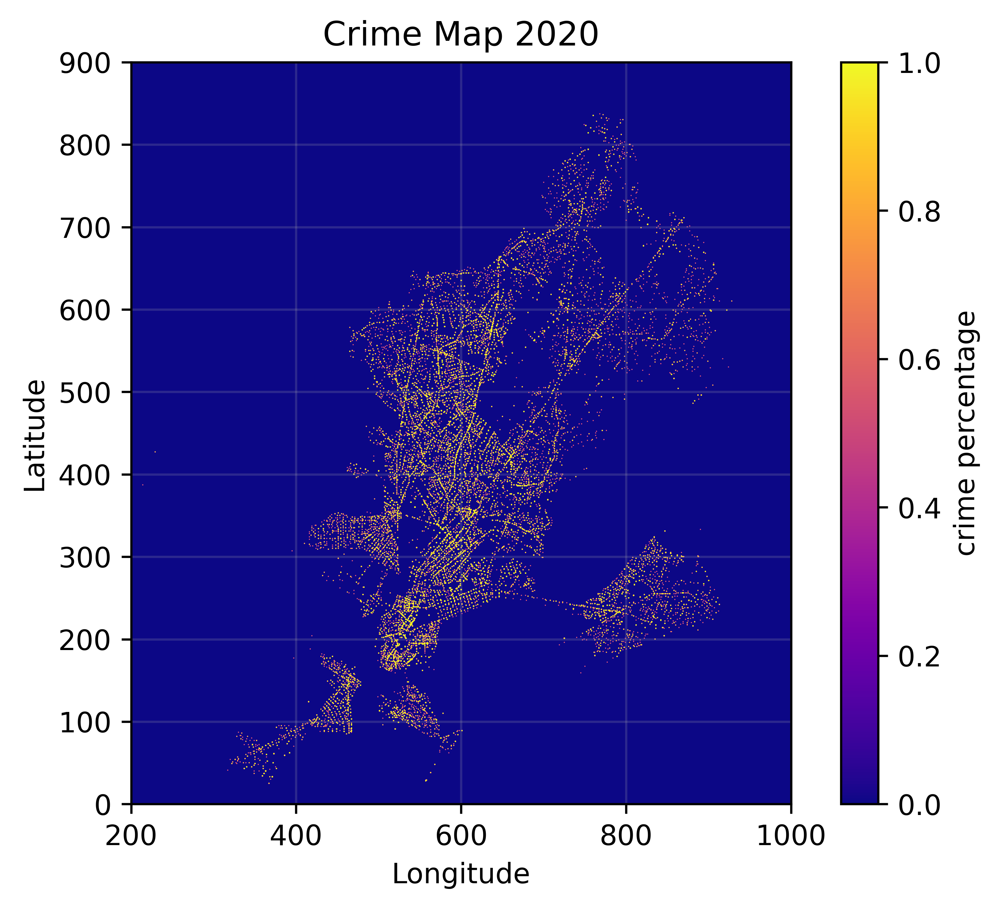

In [20]:
heatmap(crime_2020, 2020)

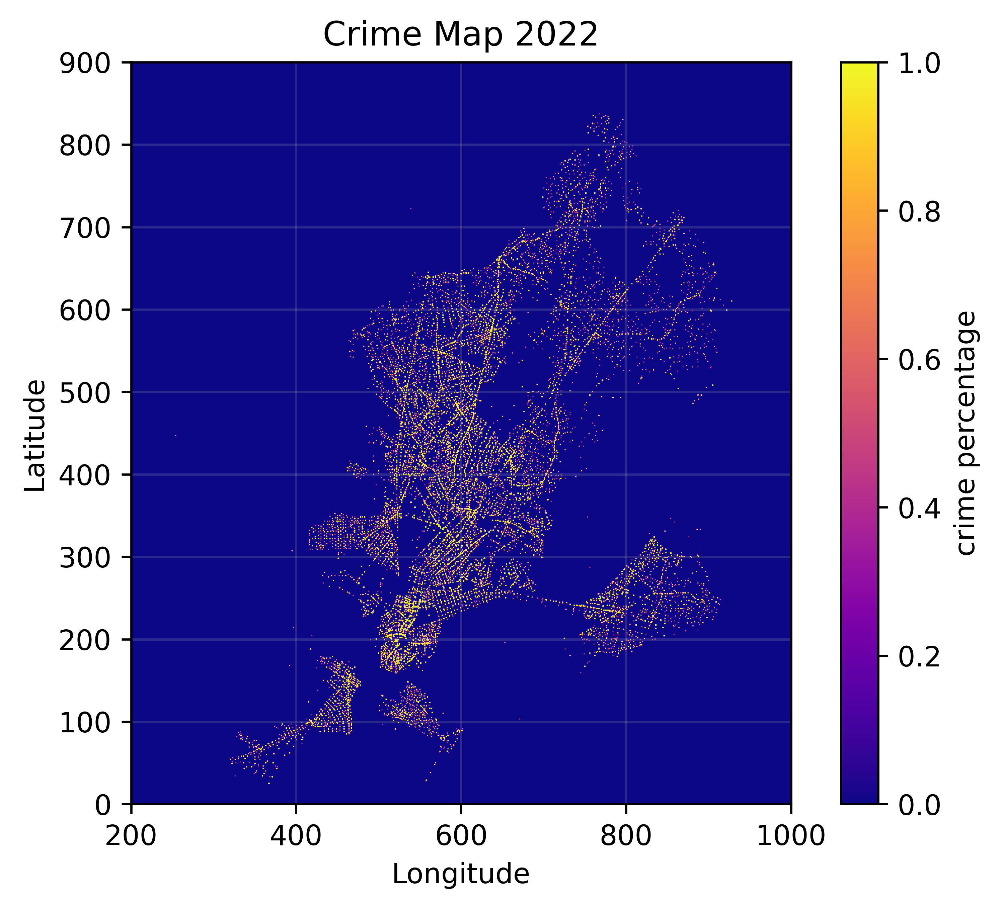

In [21]:
heatmap(crime_2022, 2022)

## interactive heat map

In [22]:
# 2018 crime
# find center of boston (coordinate from google)
boston_loc=[42.3601, -71.0589]

# Create the map
boston = folium.Map(location=boston_loc, zoom_start=11.65)

# Prepare data for HeatMap
df_map_2018 = merged_df[merged_df['YEAR'] == 2018][['Lat', 'Long']].values.tolist()

# Create a colormap for the heatmap
colormap = LinearColormap(['green', 'yellow', 'red'], vmin=0, vmax=1)

# Add heatmap layer to the map
HeatMap(df_map_2018, gradient={0.2: 'green', 0.5: 'yellow', 1: 'red'}, 
        min_opacity=4, radius=7, blur=15).add_to(boston)

# Add the color legend to the map
colormap.caption = 'Crime Occurance'
boston.add_child(colormap)

# Add a title to the map
folium.map.LayerControl('topright', title='Crime Heatmap').add_to(boston)

# Display the map with the heatmap
boston

In [23]:
# 2020 crime
# find center of boston (coordinate from google)
boston_loc=[42.3601, -71.0589]

# Create the map
boston = folium.Map(location=boston_loc, zoom_start=11.65)

# Prepare data for HeatMap
df_map_2020 = merged_df[merged_df['YEAR'] == 2020][['Lat', 'Long']].values.tolist()

# Create a colormap for the heatmap
colormap = LinearColormap(['green', 'yellow', 'red'], vmin=0, vmax=1)

# Add heatmap layer to the map
HeatMap(df_map_2020, gradient={0.2: 'green', 0.5: 'yellow', 1: 'red'}, 
        min_opacity=4, radius=7, blur=15).add_to(boston)

# Add the color legend to the map
colormap.caption = 'Crime Occurance'
boston.add_child(colormap)

# Add a title to the map
folium.map.LayerControl('topright', title='Crime Heatmap').add_to(boston)

# Display the map with the heatmap
boston

In [32]:
# heatmap for 2022
# find center of boston (coordinate from google)
boston_loc=[42.3601, -71.0589]

# Create the map
boston = folium.Map(location=boston_loc, zoom_start=11.65)

# Prepare data for HeatMap
df_map_2022 = merged_df[merged_df['YEAR'] == 2022][['Lat', 'Long']].values.tolist()

# Create a colormap for the heatmap
colormap = LinearColormap(['green', 'yellow', 'red'], vmin=0, vmax=1)

# Add heatmap layer to the map
HeatMap(df_map_2022, gradient={0.2: 'green', 0.5: 'yellow', 1: 'red'}, 
        min_opacity=4, radius=7, blur=15).add_to(boston)

# Add the color legend to the map
colormap.caption = 'Crime Occurance'
boston.add_child(colormap)

# Add a title to the map
folium.map.LayerControl('topright', title='Crime Heatmap').add_to(boston)

# Display the map with the heatmap
boston

### Pie chart

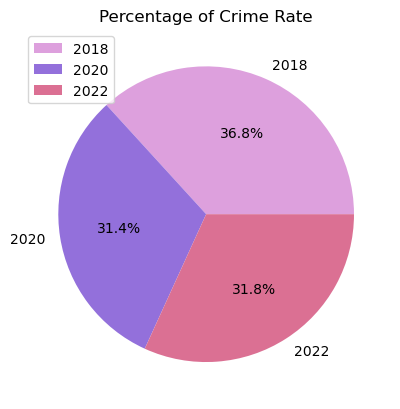

In [33]:
# find the total crime of each year & put it to list
m_total = m_crime.sum().values.tolist()

# list of label
labels = [2018, 2020, 2022]
color = ['plum', 'mediumpurple', 'palevioletred']


plt.pie(m_total, labels=labels, colors = color, autopct='%1.1f%%')
plt.title('Percentage of Crime Rate')
plt.legend(loc ='upper left')
plt.show()


In [34]:
# plot pie
fig = px.pie(data_frame=d_crime, names=d_crime.index, values='total', color=d_crime.index)

# Edit the hover_data
fig.update_traces(hovertemplate='Day: %{label}<br>Count: %{value}')

# Add title
fig.update_layout(title=f'Crime Precentage For Each Day of Week from 2018-2022',
                  xaxis_title='Day of Week', yaxis_title='Total Crime Count')

fig.show()

### Histogram

In [35]:
def hist(df, year):
    """plot a histogram
    Args:
        df: dataframe
    """
    # filter out col = hours and put into a list
    df_hour = df['HOUR'].values.tolist()
    
    # plot
    plt.hist(df_hour, bins=24, edgecolor='black', color='plum')
    
    # label
    plt.title(f'Crime Time Occurance {year}')
    plt.xlim(0,24)
    plt.xticks(range(0,24))
    plt.xlabel('Crime Time (Military Hours)')
    plt.ylabel('Crime Counts')
    plt.grid(alpha=0.2)
    plt.show()

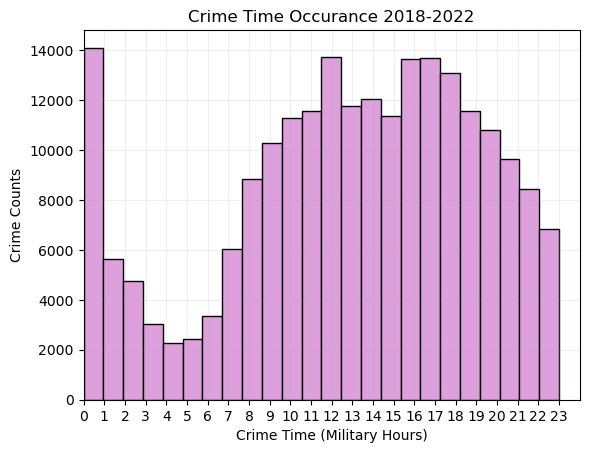

In [36]:
# histogram of 2018-2022
hist(merged_df, "2018-2022")


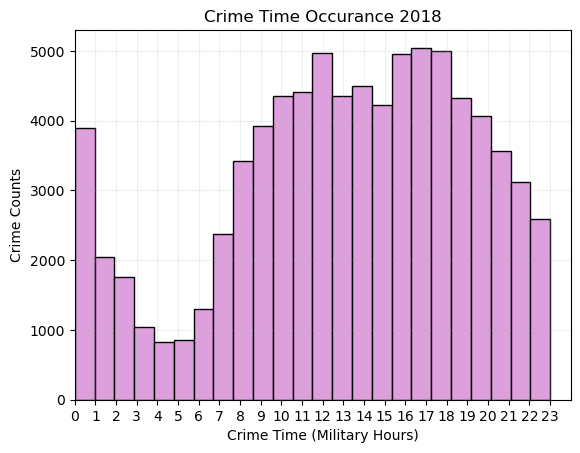

In [38]:
# histogram of 2018
hist(crime_2018, 2018)

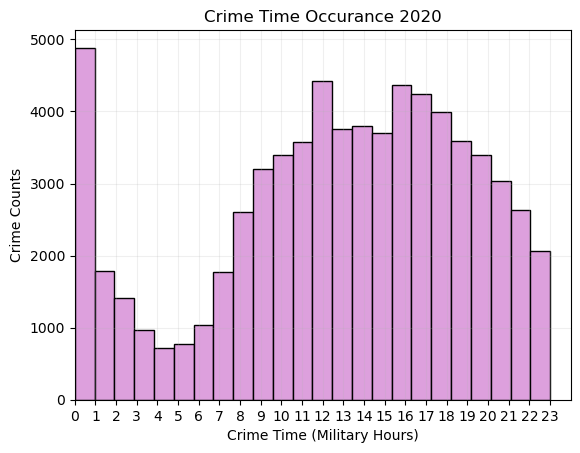

In [39]:
# histogram of 2020
hist(crime_2020, 2020)

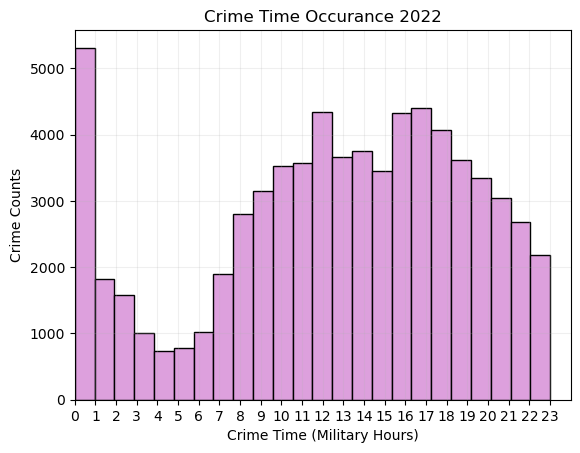

In [40]:
# histogram of 2022
hist(crime_2022, 2022)